<div style="border: 10px solid blue; padding: 20px; font-family: Arial, sans-serif; text-align: center;">

# *RÉPUBLIQUE DU SÉNÉGAL*      
<div style="text-align: center;">
    <h3>Un peuple - un But - une Foi</h3>
</div>

<img src="Republique_du_Senegal.jpg" alt="Logo République du Sénégal" style="width: 100px; margin-top: 10px;">

---

## *Agence Nationale de la Statistique et de la Démographie*  
<img src="ANSD.jpg" alt="Logo ANSD" style="width: 120px; margin-top: 10px;">  

### *École Nationale de la Statistique et de l'Analyse Économique Pierre Ndiaye*  
<img src="ENSAE-Dakar-logo.jpg" alt="Logo ENSAE" style="width: 120px; margin-top: 10px;">

---

<div style="background-color: blue; color: white; text-align: center; padding: 10px; font-weight: bold; display: inline-block;">
Projet de Machine Learning 1
</div>

<div style="text-align: center;">
    <h3>Sujet :</h3>
</div>
    
    
---
    
## *Student Performance*  

---

<div style="text-align: center;">
    <h3>Rédigé par :</h3>
    <p style="font-size: 20px; text-align: center;">
        FAMARA SADIO<br>
        AMADOU YOUM<br>
        SARAN NDIAYE<br>
        YAGUE DIOP
    </p>
</div>

---

<div style="text-align: center;">
    <h3>Sous la supervision de :</h3>
    <p style="font-size: 20px; text-align: center;">
        MOUSLY DIAW<br>
        Data scientist / ML Engineer / Auto-Entrepreneur
    </p>
</div>
    
---

    © ISE2_Décembre 2024
    
</div>

## <b>PLAN</b>

## I. Data pre-processing

## II. Summary statistics

## III. Data vizualisation

## IV. Features selection

<div style="background-color: RGB(51,165,182); text-align: left;">
    <h1 style="margin: auto; padding: 20px; color:#fff;"><b>INTRODUCTION & OBJECTIF</b></h1>
</div>
---

La prédiction de la performance académique des étudiants est un enjeu majeur dans le domaine de l'éducation. Avec l'essor des méthodes de **Machine Learning**, il devient possible d'analyser de manière approfondie les facteurs qui influencent les résultats scolaires afin d'anticiper et d'améliorer les performances des élèves. Le présent projet, intitulé **"Student Performance Factors"**, s'inscrit dans le cadre d'un cas pratique réalisé pour le cours de **Machine Learning**. 

- **L'objectif principal** de ce projet est de développer un modèle prédictif capable d'estimer la **performance des étudiants** en milieu scolaire, mesurée par la **variable cible** : **"Exam_Score"**, en se basant sur un ensemble de de données provenant du site **Kaggle**.

Pour atteindre notre objectif, nous allons comparer plusieurs modèles de régression afin d'identifier celui qui offre les meilleures performances prédictives. Les modèles testés incluent :  
- **Linear Regression**  
- **Ridge Regression** 
- **Lasso Regression**
- **ElasticNet**  
- **XGBoost Regressor**  
- **Random Forest regressor**  
- **K-Nearest Neighbors (KNN)**
- **Bagging Regressor**
- **Gradient Boosting regressor**
- **SGD regressor**

- La sélection du meilleur modèle se fera à l'aide de métriques telles que l'**erreur quadratique moyenne (RMSE)** et le **coefficient de détermination (R²)**. 

<div style="background-color: RGB(51,165,182); text-align: left;">
    <h1 style="margin: auto; padding: 20px; color:#fff;"><b>I. Data pre-processing</b></h1>
</div>

## I.1. Importation des librairies

In [1]:
# Ignorer les avertissements
import warnings
warnings.filterwarnings('ignore')
import numpy as np   # pour les calculs scientifiques, algèbre, etc.
import pandas as pd  # manipuler les data frames 
import seaborn as sns #  pour faire les graphiques 
import matplotlib.pyplot as plt  # pour faire les graphiques 
import plotly.express as px # pour les graphes interactifs 
import missingno as msno  # pour les valeurs manquantes
from ydata_profiling import ProfileReport # pour faire le rapport complet
from scipy.stats import chi2_contingency # affiche le tableau de contingence

from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score, validation_curve, GridSearchCV # decoupage en train et en test,validation croisée, courbe d'apprentissage  
from sklearn.pipeline import make_pipeline, Pipeline # pipieline
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler # standardisation 
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error # metriques de validation 
from sklearn.impute import KNNImputer # pour imputer par les K plus proche voisins

from sklearn.linear_model import LinearRegression, SGDRegressor # regression lineaire
from sklearn.linear_model import Ridge # Regression ridge 
from sklearn.linear_model import Lasso # Regression lasso 
from sklearn.linear_model import ElasticNet # Elastic net 
from sklearn.ensemble import RandomForestRegressor  # Pour le random forest

from sklearn.svm import SVR # Super vector Machine 
from xgboost import XGBRegressor # Regression XGBoost
from sklearn.preprocessing import PolynomialFeatures   # polynomiales
from yellowbrick.target import FeatureCorrelation      # Pour le feature selection
from yellowbrick.model_selection import LearningCurve  # Courbes d'apprenstissages

## I.2. Importation de la base de données

In [2]:
# Importation de la base de données
data = pd.read_csv('StudentPerformanceFactors.csv')

### Présentation des variables 

Cet ensemble de données fournit un aperçu complet des différents facteurs nécessaires pour expliquer les performances des étudiants aux examens. Il comprend des informations sur les habitudes d'étude, l'assiduité, l'implication des parents et d'autres aspects influençant la réussite scolaire.

| Attribute                   | Description                                                                                     |
|-----------------------------|-------------------------------------------------------------------------------------------------|
| Hours_Studied               | Number of hours spent studying per week.                                                        |
| Attendance                  | Percentage of classes attended.                                                                 |
| Parental_Involvement        | Level of parental involvement in the student's education (Low, Medium, High).                   |
| Access_to_Resources         | Availability of educational resources (Low, Medium, High).                                      |
| Extracurricular_Activities  | Participation in extracurricular activities (Yes, No).                                          |
| Sleep_Hours                 | Average number of hours of sleep per night.                                                     |
| Previous_Scores             | Scores from previous exams.                                                                     |
| Motivation_Level            | Student's level of motivation (Low, Medium, High).                                              |
| Internet_Access             | Availability of internet access (Yes, No).                                                      |
| Tutoring_Sessions           | Number of tutoring sessions attended per month.                                                 |
| Family_Income               | Family income level (Low, Medium, High).                                                        |
| Teacher_quality             | quality of the teachers (Low, Medium, High).                                                    |
| School_Type                 | Type of school attended (Public, Private).                                                      |
| Peer_Influence              | Influence of peers on academic performance (Positive, Neutral, Negative).                       |
| Physical_Activity           | Average number of hours of physical activity per week.                                          |
| Learning_Disabilities       | Presence of learning disabilities (Yes, No).                                                    |
| Parental_Education_Level    | Highest education level of parents (High School, College, Postgraduate).                        |
| Distance_from_Home          | Distance from home to school (Near, Moderate, Far).                                             |
| Gender                      | Gender of the student (Male, Female).                                                           |
| Exam_Score                  | Final exam score.                                                                               |


## I.3 Traitement de données 


Pour le traitement, nous allons effectuer les étapes suivantes:

- Exploration de la base en affichant quelques lignes et toutes les variables
- La dimension de la base de données (présentation du nombre de lignes et de colones)
- Présentation de la nature des variables
- Traitement des valeurs manquantes

In [4]:
# les premières observations 
data.head()

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,23,84,Low,High,No,7,73,Low,Yes,0,Low,Medium,Public,Positive,3,No,High School,Near,Male,67
1,19,64,Low,Medium,No,8,59,Low,Yes,2,Medium,Medium,Public,Negative,4,No,College,Moderate,Female,61
2,24,98,Medium,Medium,Yes,7,91,Medium,Yes,2,Medium,Medium,Public,Neutral,4,No,Postgraduate,Near,Male,74
3,29,89,Low,Medium,Yes,8,98,Medium,Yes,1,Medium,Medium,Public,Negative,4,No,High School,Moderate,Male,71
4,19,92,Medium,Medium,Yes,6,65,Medium,Yes,3,Medium,High,Public,Neutral,4,No,College,Near,Female,70


In [9]:
## taille de la data set 
data.shape

(6607, 20)

La base de données contient 6607 observations ou lignes et 20 variables ou colonnes

In [10]:
# qualité des données 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6607 entries, 0 to 6606
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Hours_Studied               6607 non-null   int64 
 1   Attendance                  6607 non-null   int64 
 2   Parental_Involvement        6607 non-null   object
 3   Access_to_Resources         6607 non-null   object
 4   Extracurricular_Activities  6607 non-null   object
 5   Sleep_Hours                 6607 non-null   int64 
 6   Previous_Scores             6607 non-null   int64 
 7   Motivation_Level            6607 non-null   object
 8   Internet_Access             6607 non-null   object
 9   Tutoring_Sessions           6607 non-null   int64 
 10  Family_Income               6607 non-null   object
 11  Teacher_Quality             6529 non-null   object
 12  School_Type                 6607 non-null   object
 13  Peer_Influence              6607 non-null   obje

In [11]:
# Analyse des doublons
data.duplicated().sum()

0

Il n' y a pas de doublons dans la base de données

## I.4.Traitement des valeurs manquantes

In [12]:
# Affichage des valeurs manquantes en pourcentage(%)
missing = 100*data.isna().sum()/len(data)
missing_data = pd.DataFrame({"valeurs manquantes (%)":missing})
missing_data.reset_index()

,index,valeurs manquantes (%)
0,Hours_Studied,0.000000
1,Attendance,0.000000
2,Parental_Involvement,0.000000
3,Access_to_Resources,0.000000
4,Extracurricular_Activities,0.000000
5,Sleep_Hours,0.000000
6,Previous_Scores,0.000000
7,Motivation_Level,0.000000
8,Internet_Access,0.000000
9,Tutoring_Sessions,0.000000


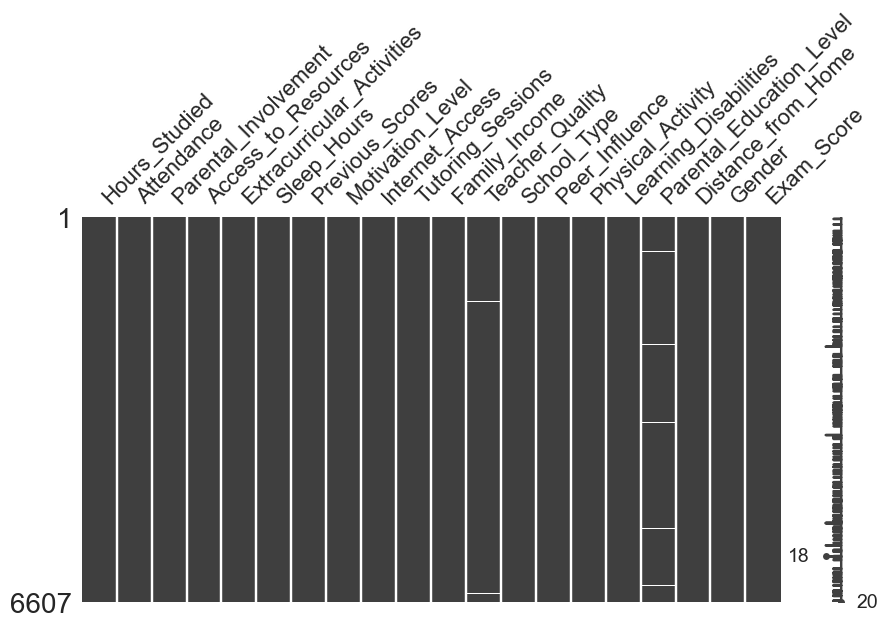

In [13]:
# A matrix visualization of the nullity of the given DataFrame (pick out patterns in data completion).

msno.matrix(data, figsize=(10, 5));

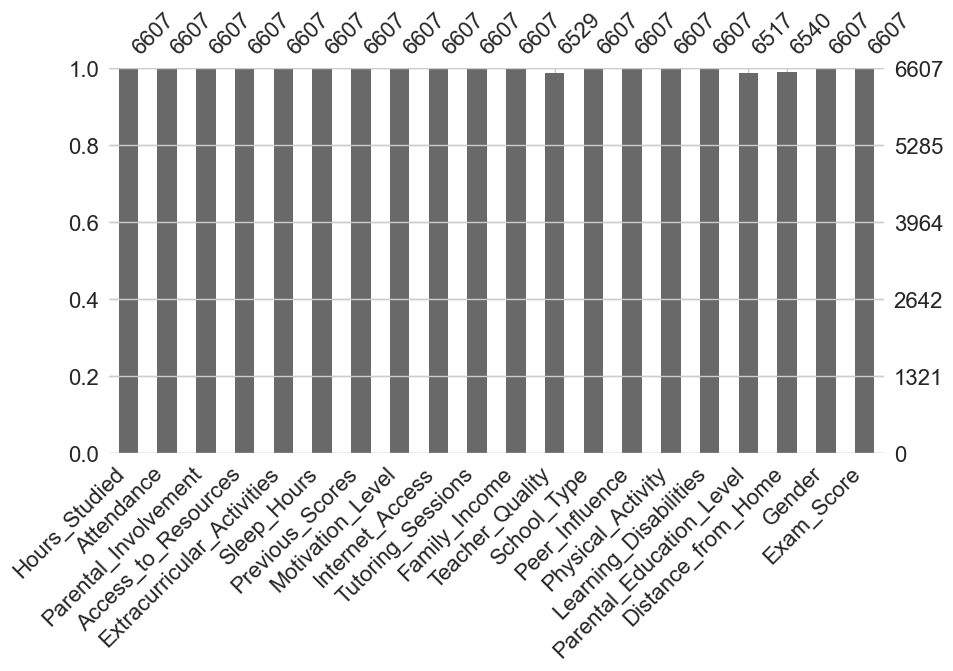

In [14]:
# A bar chart visualization of the nullity of the given DataFrame.
msno.bar(data, figsize=(10, 5));

On constate que peu de variables contiennent des valeurs manquantes: Teacher_quality possède 1.18% de variables manquantes, Parental_Education_Level possède 1.36% de valeurs manquantes, Distance_from_Home possède 1.01%

## I.5. Imputation des valeurs manquantes par le mode

Il existe plusieurs méthodes pour imputer les valeurs manquantes notamment: "l'imputation par la médiane, par le mode"...
Dans notre cas-ci, nous allons utiliser l'imputation par le mode car il s'agit des variables qualitatives ayant des valeurs manquantes dans des proportions faibles.

In [15]:
# imputation des valeurs manquantes par le mode
data['Teacher_Quality'].fillna(data['Teacher_Quality'].mode()[0], inplace=True)
data['Parental_Education_Level'].fillna(data['Parental_Education_Level'].mode()[0], inplace=True)
data['Distance_from_Home'].fillna(data['Distance_from_Home'].mode()[0], inplace=True)

In [16]:
data.isna().sum()

Hours_Studied                 0
Attendance                    0
Parental_Involvement          0
Access_to_Resources           0
Extracurricular_Activities    0
Sleep_Hours                   0
Previous_Scores               0
Motivation_Level              0
Internet_Access               0
Tutoring_Sessions             0
Family_Income                 0
Teacher_Quality               0
School_Type                   0
Peer_Influence                0
Physical_Activity             0
Learning_Disabilities         0
Parental_Education_Level      0
Distance_from_Home            0
Gender                        0
Exam_Score                    0
dtype: int64

On remarque qu'il n'existe plus de variables ayant des valeurs manquantes

<div style="background-color: RGB(51,165,182); text-align: left;">
    <h1 style="margin: auto; padding: 20px; color:#fff;"><b>II. Summary Statistics</b></h1>
</div>

## Description des variables quantitatives

In [17]:
# Generate descriptive statistics
data.describe()

,Hours_Studied,Attendance,Sleep_Hours,Previous_Scores,Tutoring_Sessions,Physical_Activity,Exam_Score
count,6607.000000,6607.000000,6607.00000,6607.000000,6607.000000,6607.000000,6607.000000
mean,19.975329,79.977448,7.02906,75.070531,1.493719,2.967610,67.235659
std,5.990594,11.547475,1.46812,14.399784,1.230570,1.031231,3.890456
min,1.000000,60.000000,4.00000,50.000000,0.000000,0.000000,55.000000
25%,16.000000,70.000000,6.00000,63.000000,1.000000,2.000000,65.000000
50%,20.000000,80.000000,7.00000,75.000000,1.000000,3.000000,67.000000
75%,24.000000,90.000000,8.00000,88.000000,2.000000,4.000000,69.000000
max,44.000000,100.000000,10.00000,100.000000,8.000000,6.000000,101.000000


- Le tableau ci-dessus décrit les différentes variables à travers le nombre d'observation, la moyenne, l'écart-type
les quartiles d'ordre 25%, 75% et la médiane(50%) ainsi que les valeurs minimales et maximales de chaque variable
- De plus, tous les variables ont le même nombre d'observation car celles qui avaient des manquantes par le mode
(seulement les variables qualitatives)
- Les variables quantitatives qui ont des valeurs maximales égales à 100 (max=100) sont des scores (pourcentages)
Donc, ils n'ont pas les mêmes unités (échelle)
- ce constat implique que l'on doit centrer et réduire les variables quantitatives pour régler le problème d'échelle.

## Description des variables qualitatives

In [18]:
# Sélectionnons uniquement les colonnes qualitatives (type 'object' ou 'category')
qualitative_vars = data.select_dtypes(include=['object', 'category']).columns

# Création d'un dictionnaire pour stocker les résultats
result_tables = {}

# Boucle sur chaque variable qualitative pour calculer les modalités, effectifs, et proportions
for var in qualitative_vars:
    # Calcul des effectifs
    counts = data[var].value_counts()
    
    # Calcul des proportions
    proportions = data[var].value_counts(normalize=True) * 100  # en pourcentage
    
    # Création d'un DataFrame pour chaque variable avec effectifs et proportions
    result_table = pd.DataFrame({
        'Modalité': counts.index,
        'Effectif': counts.values,
        'Proportion (%)': proportions.values
    })
    
    # Ajout du tableau au dictionnaire de résultats
    result_tables[var] = result_table

# Affichage de chaque tableau 
for var, table in result_tables.items():
    print(f"\nTableau pour la variable : {var}")
    print(table)


Tableau pour la variable : Parental_Involvement
  Modalité  Effectif  Proportion (%)
0   Medium      3362       50.885425
1     High      1908       28.878462
2      Low      1337       20.236113

Tableau pour la variable : Access_to_Resources
  Modalité  Effectif  Proportion (%)
0   Medium      3319       50.234600
1     High      1975       29.892538
2      Low      1313       19.872862

Tableau pour la variable : Extracurricular_Activities
  Modalité  Effectif  Proportion (%)
0      Yes      3938       59.603451
1       No      2669       40.396549

Tableau pour la variable : Motivation_Level
  Modalité  Effectif  Proportion (%)
0   Medium      3351       50.718934
1      Low      1937       29.317391
2     High      1319       19.963675

Tableau pour la variable : Internet_Access
  Modalité  Effectif  Proportion (%)
0      Yes      6108       92.447404
1       No       499        7.552596

Tableau pour la variable : Family_Income
  Modalité  Effectif  Proportion (%)
0      Low    

Les tableaux ci-dessus résument les proportions des catégories pour chaque variable qualitatives

<div style="background-color: RGB(51,165,182); text-align: left;">
    <h1 style="margin: auto; padding: 20px; color:#fff;"><b>III. Data Vizualisation</b></h1>
</div>

## Nuage de points des variables

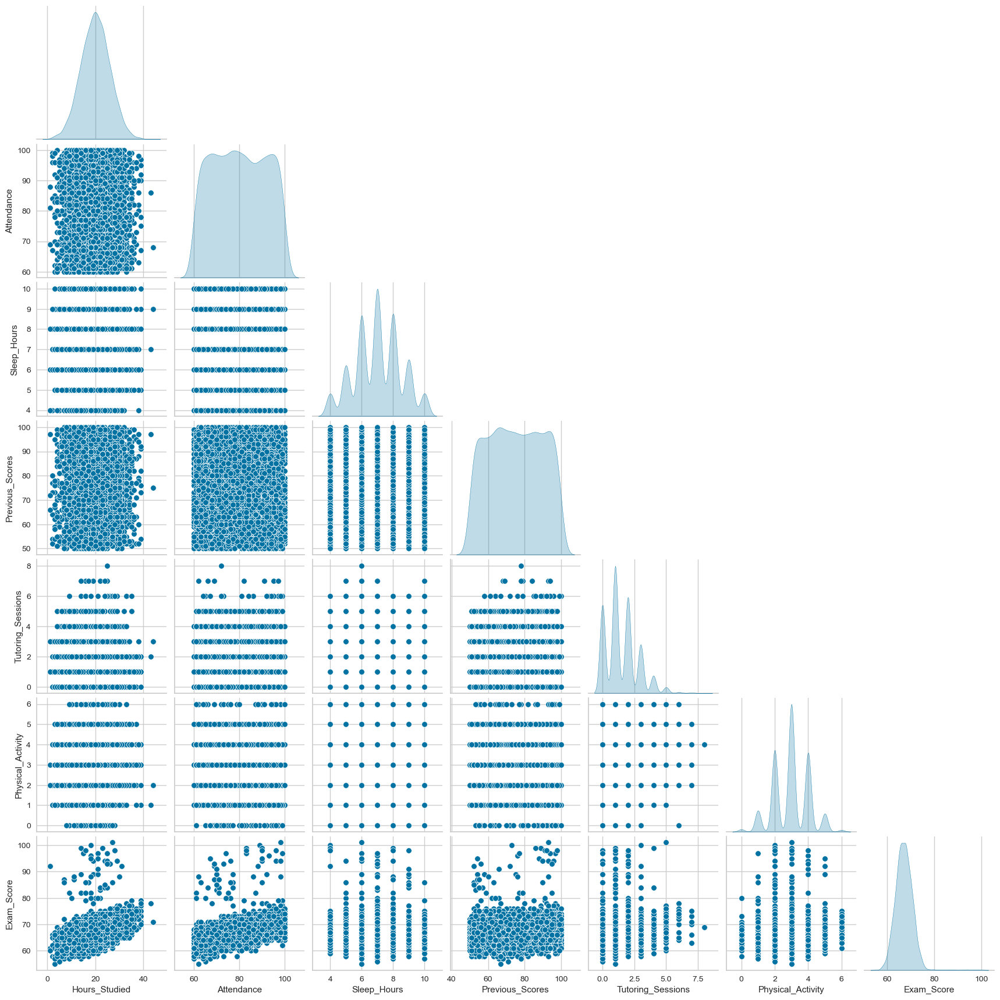

In [19]:
# nuage de points
sns.pairplot(data, palette="Paired", corner=True, diag_kind="kde");

- En parcourant les corrélations entre la variable à prédire Exama_score et les variables explicatives, on peut faire les constats: Hours_Studied, Attendance, previous_Scores et Tutoring_Sessions entretiennent potentiellement une relation linéaire avec la variable Exam_Score. 

- Les autres variables ne semble pas entretenir de relation linéaire avec la variable Exam_Score

- La diagonale principale donne les distributions ou densités de chaque variable verticalement

- Le diagramme de corrélation ci-dessous confirmera nos résultats

## Diagramme de corrélation

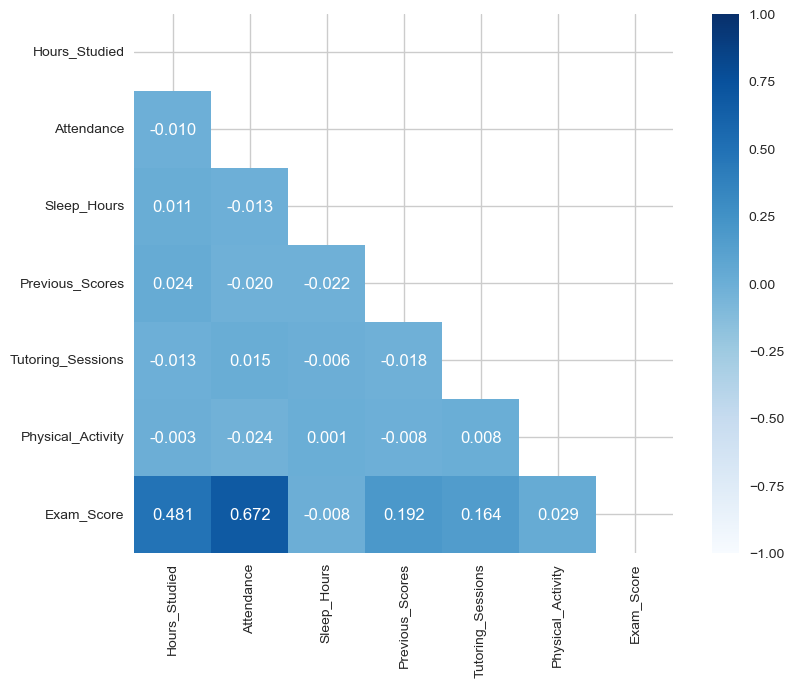

In [20]:
# correlation plot
plt.figure(figsize=(10, 7))
# corrélation au sens de spearman
corr = data.select_dtypes(include=[int, float]).corr(method="spearman")
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

# Affichage de la figure
sns.heatmap(corr, cmap='Blues', annot=True, square=True,
            fmt='.3f',
            mask=mask,
            cbar=True, vmin=-1, vmax=1);

- On constate que les variables Hours_Studied, Attendance, Previous_Scores et Tutoring_Sessionont des corrélations positives avec la variable Exam_Score, ce qui signifie qu'elles évoluent dans le même sens(si la variable explicative augmente d'une unité, toute chose étant égale par ailleurs, cela entrainera une augmentation de la variable à prédire). contrairement à la variable Sleep_Hours qui a une corrélation négative.

- Les autres variables ont des corrélations faibles, donc absence de multicolinéarité entre les variables explicatives



## Analyse des valeurs extrêmes (visualisation des variables quantitatives)

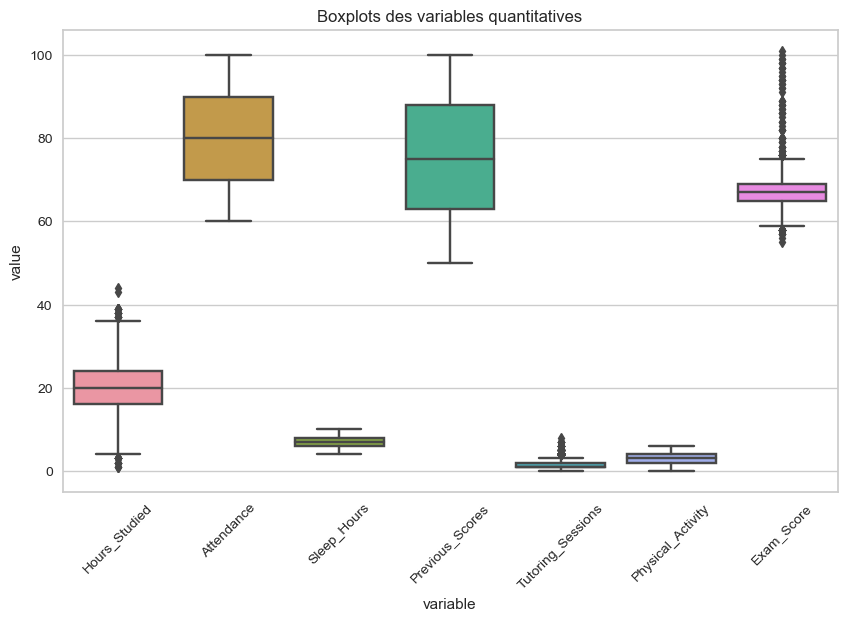

In [21]:
# récupération des variables quantitatives
quantitative_data = data.select_dtypes(include=['float64', 'int64'])

# Transformation en format long
melted_data = pd.melt(quantitative_data)

# Création du boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x="variable", y="value", data=melted_data)
plt.xticks(rotation=45)
plt.title("Boxplots des variables quantitatives")
plt.show()

On constate la présence des valeurs extrêmes entre les variables

Nous allons traiter les valeurs aberrantes par la standaristion ou la normalisation

## Visualisation des variables catégorielles

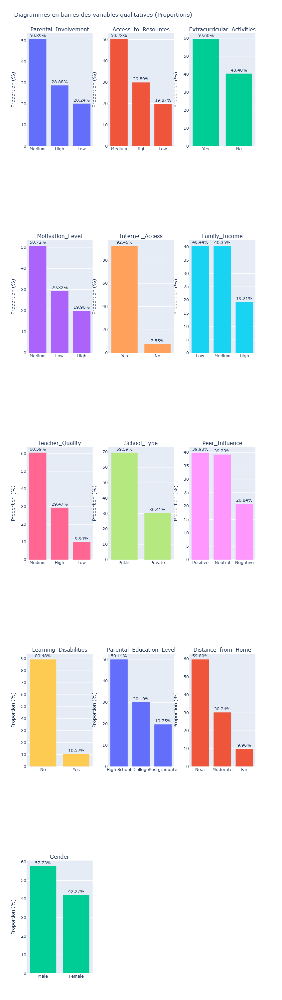

In [23]:
# librairy
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# DataFrame des variables qualitatives
qualitative_data = data.select_dtypes(include=['object', 'category'])

# Définition du nombre de colonnes
num_cols = 3
num_vars = len(qualitative_data.columns)
num_rows = -(-num_vars // num_cols)  

# Création de la grille
fig = make_subplots(rows=num_rows, cols=num_cols, 
                    subplot_titles=[f"{col}" for col in qualitative_data.columns])

# valeurs initiales
row, col = 1, 1

# Boucle pour chaque variable qualitative
for column in qualitative_data.columns:
    # Calcul des proportions
    proportion_data = qualitative_data[column].value_counts(normalize=True) * 100
    
    # Conversion en DataFrame
    df_proportion = proportion_data.reset_index()
    df_proportion.columns = [column, 'Proportion']
    
    # Création d'une trace de diagramme en barres
    trace = go.Bar(
        x=df_proportion[column],
        y=df_proportion['Proportion'],
        text=df_proportion['Proportion'].apply(lambda x: f'{x:.2f}%'),
        textposition='outside',
        name=column
    )
    
    # Ajout de la trace à la bonne position dans la grille
    fig.add_trace(trace, row=row, col=col)
    
    # incrémentation
    col += 1
    if col > num_cols:  
        col = 1
        row += 1

# Mise en forme des graphes
fig.update_layout(
    title_text="Diagrammes en barres des variables qualitatives (Proportions)",
    showlegend=False,
    height=600 * num_rows,  # Ajuster la hauteur en fonction du nombre de lignes
    width=900
)

# Mise en forme des axes
fig.update_yaxes(title_text="Proportion (%)")

# Affichage
fig.show()


## Analyse bivariée entre la variable à prédire et les variables qualitatives

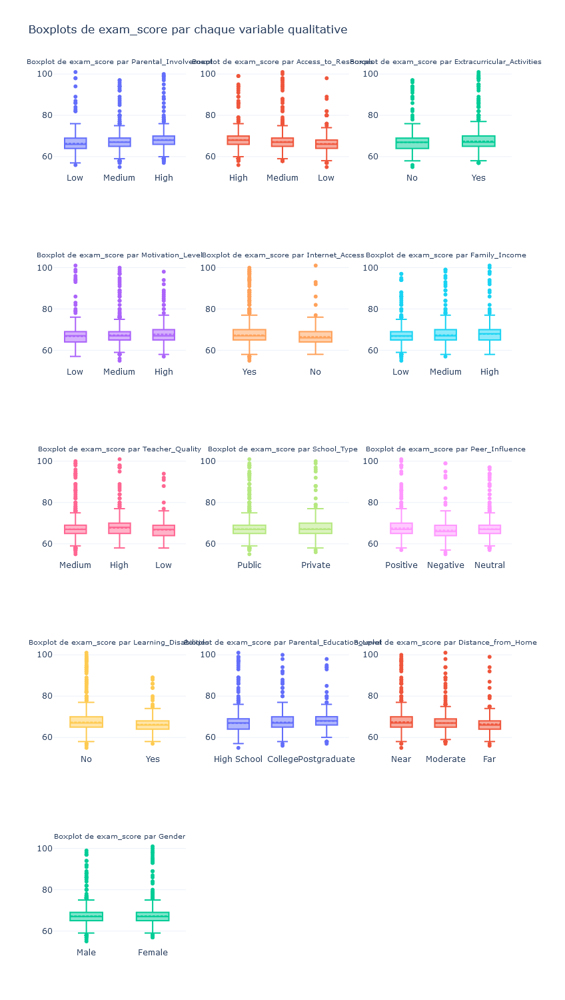

In [24]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Sélection des variables qualitatives
qualitative_data = data.select_dtypes(include=['object', 'category'])

# Nombre de variables qualitatives
num_variables = len(qualitative_data.columns)

# Créer une grille de sous-graphiques (ajustée en fonction du nombre de variables)
# Si nous avons moins de 12 variables, nous ajustons la taille de la grille pour s'adapter aux données
rows = (num_variables // 3) + (1 if num_variables % 3 != 0 else 0)
cols = 3 if num_variables > 3 else num_variables

# Créer la grille de sous-graphiques (4 lignes et 3 colonnes)
fig = make_subplots(
    rows=rows, cols=cols, 
    subplot_titles=[f"Boxplot de exam_score par {column}" for column in qualitative_data.columns]
)

# Variables pour suivre les positions des sous-graphiques
row, col = 1, 1

# Création des boxplots pour chaque variable qualitative
for column in qualitative_data.columns:
    boxplot = go.Box(
        x=data[column], 
        y=data['Exam_Score'], 
        boxmean=True,
        name=column
    )
    
    # Ajouter le boxplot à la bonne position dans la grille
    fig.add_trace(boxplot, row=row, col=col)
    
    # Avancer la colonne
    col += 1
    if col > 3:
        col = 1
        row += 1

# Mise en page finale des graphiques
fig.update_layout(
    title_text="Boxplots de exam_score par chaque variable qualitative",
    height=300 * rows,  # Ajuste la hauteur totale pour s'adapter au nombre de lignes
    width=900,   # Ajuste la largeur pour 3 colonnes
    showlegend=False,
    template="plotly_white"
)

# Réduction de la taille des sous-titres
fig.update_annotations(font_size=10)

# Affichage
fig.show()


# Commentaire général
On constate que les distributions de certaines variables ont des valeurs extrêmes, ce qui pourrait biaisé les résultat de 
l'estimation. Mais nous n'allons pas effectué le traitement car ces variables seront toute standardisées lors de la création des pipelines qui intégrera le RobustScaler comme technique de standardisation.

## Génération d'un résumé de toutes les étapes précédentes

In [25]:
# Generate a profile report from a Dataset stored as a pandas `DataFrame`.

profile = ProfileReport(data, title="Profiling Report")
profile.to_notebook_iframe()  # Used to output the HTML representation to a Jupyter notebook.
# profile.to_file("data_report.html")  # Write the report to a file.

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<div style="background-color: RGB(51,165,182); text-align: left;">
    <h1 style="margin: auto; padding: 20px; color:#fff;"><b>IV.Features Selection, encodage des variables catégorielles et standardisation
</b></h1>
</div>
---

Pour appliquer l'encodage, la standardisation ou la normalisation, on va séparer les variables en deux groupes: 
les variables qualitatives et les variables quantitatives. Sur les variables quantitatives, on va appliquer les techniques de standardisation ou de normalisation et sur les variables qualitatives, on va appliquer les techniques d'encodages.

In [30]:
# séparation des données en variables quantitatives et en variables catégorielles
var_quant=data[['Exam_Score','Hours_Studied','Attendance','Sleep_Hours',
                'Previous_Scores','Tutoring_Sessions','Physical_Activity']]

var_qual=data[['Parental_Involvement','Access_to_Resources', 'Extracurricular_Activities',
               'Motivation_Level', 'Internet_Access','Family_Income', 'Teacher_Quality', 'School_Type',
               'Peer_Influence','Learning_Disabilities',
               'Parental_Education_Level', 'Distance_from_Home', 'Gender']]

print(var_quant.shape)
print(var_qual.shape)

(6607, 7)
(6607, 13)


### Features selection des variables quantitatives basées sur la variance


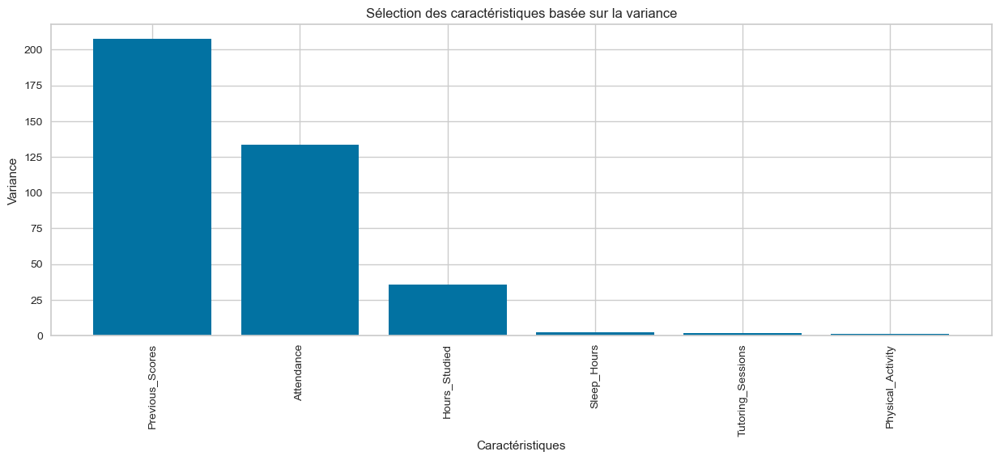

In [31]:
# Calcul de la variance pour chaque caractéristique
columns=var_quant.drop('Exam_Score',axis=1).columns
variances = np.var(var_quant.drop('Exam_Score',axis=1), axis=0)
sorted_indices = np.argsort(variances)[::-1]

# Affichage du graphe
plt.figure(figsize=(15, 5))
plt.bar(x=columns[sorted_indices], height=variances[sorted_indices])
plt.xticks(rotation=90)
plt.xlabel('Caractéristiques')
plt.ylabel('Variance')
plt.title('Sélection des caractéristiques basée sur la variance')
plt.show()

On constate la même importance des features que lorsqu'on a utilisé la corrélation

### Features selection des variables catégorielles en utilisant le test de khi-deux 

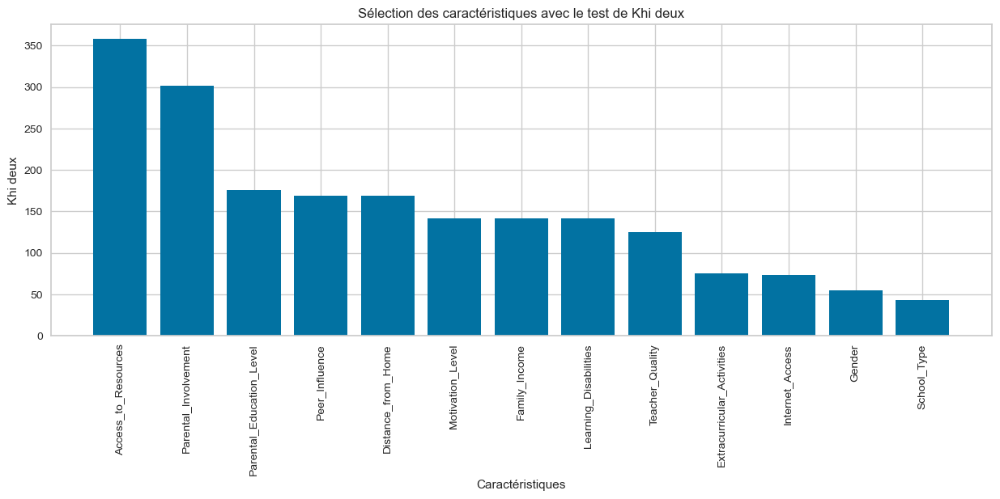

In [32]:
# Transformation des variables catégorielles en variables ordinales
encoder = OrdinalEncoder()
var_qual_ordinal = encoder.fit_transform(var_qual)

# Conversion en DataFrame 
var_qual_ordinal = pd.DataFrame(var_qual_ordinal, columns=var_qual.columns)

# Calcul des scores de Khi deux 
chi2_scores = np.array([
    chi2_contingency(pd.crosstab(var_qual_ordinal.iloc[:, i], data['Exam_Score']))[0]
    for i in range(var_qual_ordinal.shape[1])
])

# Indices triés des scores dans l'ordre décroissant
sorted_indices = np.argsort(chi2_scores)[::-1]

# Affichage du diagramme 
plt.figure(figsize=(15, 5))
plt.bar(x=var_qual_ordinal.columns[sorted_indices], height=chi2_scores[sorted_indices])
plt.xticks(rotation=90)
plt.xlabel('Caractéristiques')
plt.ylabel("Khi deux")
plt.title('Sélection des caractéristiques avec le test de Khi deux')
plt.show()

- La figure donne l'ordre dimportance des variables qualitatives pour la prédiction de la performance

### OneHoteEncoding

- le One hote encoding est utilisé pour transformer les modalités des variables catégorielles en variables dichotomiques car le modèle prend en entrée les valeurs numériques, mais pas des chaines de caractères

In [33]:
# one hote encoding
var_qual_encoded = pd.get_dummies(var_qual,drop_first=True)
var_qual_encoded=var_qual_encoded.astype(int)
var_qual_encoded.head()

,Parental_Involvement_Low,Parental_Involvement_Medium,Access_to_Resources_Low,Access_to_Resources_Medium,Extracurricular_Activities_Yes,Motivation_Level_Low,Motivation_Level_Medium,Internet_Access_Yes,Family_Income_Low,Family_Income_Medium,...,Teacher_Quality_Medium,School_Type_Public,Peer_Influence_Neutral,Peer_Influence_Positive,Learning_Disabilities_Yes,Parental_Education_Level_High School,Parental_Education_Level_Postgraduate,Distance_from_Home_Moderate,Distance_from_Home_Near,Gender_Male
0,1,0,0,0,0,1,0,1,1,0,...,1,1,0,1,0,1,0,0,1,1
1,1,0,0,1,0,1,0,1,0,1,...,1,1,0,0,0,0,0,1,0,0
2,0,1,0,1,1,0,1,1,0,1,...,1,1,1,0,0,0,1,0,1,1
3,1,0,0,1,1,0,1,1,0,1,...,1,1,0,0,0,1,0,1,0,1
4,0,1,0,1,1,0,1,1,0,1,...,0,1,1,0,0,0,0,0,1,0


In [34]:
# concaténation de la base des variables quantitatives et des variables encodées
data2 = pd.concat([var_quant, var_qual_encoded], axis=1)

# Afficher le DataFrame concaténé
data2.head()

,Exam_Score,Hours_Studied,Attendance,Sleep_Hours,Previous_Scores,Tutoring_Sessions,Physical_Activity,Parental_Involvement_Low,Parental_Involvement_Medium,Access_to_Resources_Low,...,Teacher_Quality_Medium,School_Type_Public,Peer_Influence_Neutral,Peer_Influence_Positive,Learning_Disabilities_Yes,Parental_Education_Level_High School,Parental_Education_Level_Postgraduate,Distance_from_Home_Moderate,Distance_from_Home_Near,Gender_Male
0,67,23,84,7,73,0,3,1,0,0,...,1,1,0,1,0,1,0,0,1,1
1,61,19,64,8,59,2,4,1,0,0,...,1,1,0,0,0,0,0,1,0,0
2,74,24,98,7,91,2,4,0,1,0,...,1,1,1,0,0,0,1,0,1,1
3,71,29,89,8,98,1,4,1,0,0,...,1,1,0,0,0,1,0,1,0,1
4,70,19,92,6,65,3,4,0,1,0,...,0,1,1,0,0,0,0,0,1,0


In [35]:
data2.shape

(6607, 28)

In [37]:
target=data2['Exam_Score']

features = data2.drop(columns=['Exam_Score'])

In [24]:
# Découpons les données en ensembles d'entraînement et de test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

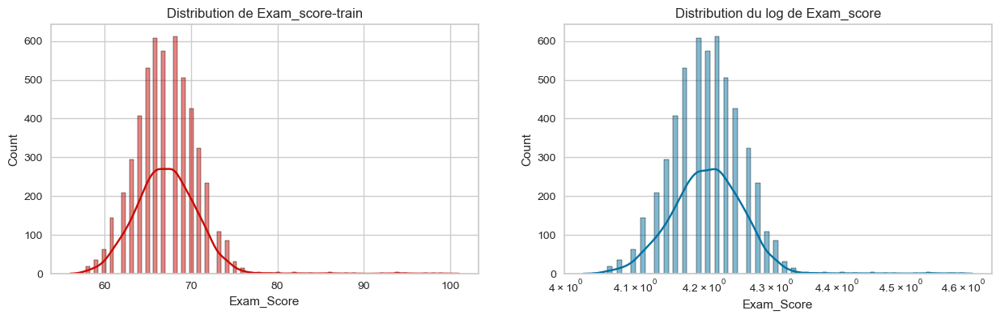

In [25]:
# Visualisation de la variable cible
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

sns.histplot(y_train, color='r', kde=True, ax=axes[0])
axes[0].set_title('Distribution de Exam_score-train')

sns.histplot(np.log(y_train), color='b', kde=True, ax=axes[1])
axes[1].set_title('Distribution du log de Exam_score')
axes[1].set_xscale('log');

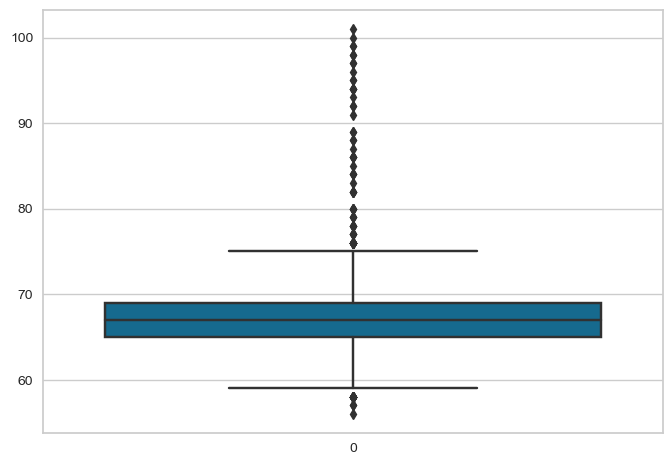

In [26]:
# Boxplot de la variable cible
sns.boxplot(y_train, orient="v");

# Traitement des valeurs extrêmes ou outliers sur la variable cible (Exam_Score) du train

Le traitement des outliers est effectué sur la variable cible des données d'entrainement pour éviter le train set contamination car, en séparant les données en train et en test, le modèle est censé n'avoir jamais vu les données de test. Dès lors, on ne peut pas traiter les outliers de la variable cible en utilisant toutes les observations. Ce qui justifie le choix de traiter la variable cible du jeu de train.

La présence des outliers sur la variable cible signifie qu'elle fluctue beaucoup, ce qui n'est pas bon car cela pourrait biaiser les prédictions du modèle. Le modèle aura tendance à prédire des scores élevés ou faibles. Nous fixons le seuil Z-score à 2, dans le but de considérer comme outliers les valeurs dont l'écart par rapport à la moyenne dépasse 3 fois l'écart-type de la distribution. 

In [27]:
seuil_z_score = 2
y_train_score = np.abs((y_train - y_train.mean()) / y_train.std())
print(f"Nous avons {len(y_train[y_train_score > seuil_z_score])} outliers pour la variable cible.")

Nous avons 124 outliers pour la variable cible.


In [28]:
# suppression des outliers en utilisant le seuil Z-score
y_train = y_train[y_train_score < seuil_z_score]

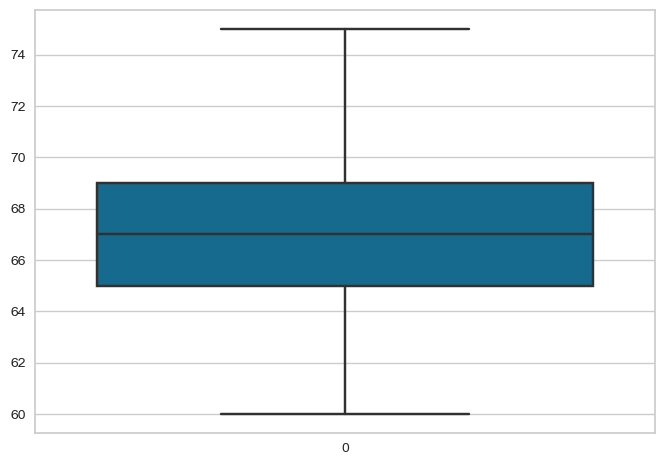

In [43]:
# Boxplot de la variable cible du train 
sns.boxplot(y_train, orient="v");

On constate que notre variable cible n'a plus de outliers

# Résumé des opérations effectuées pour le pipeline

* Séparation du data set en varibales quantitatives et qualitatives
* Imputation des valeurs manquantes des variables catégorielles
* Correction des outliers de la variable cible du train 
* On a reservé la standardisation pour le pipeline 
* Encodage des variables catégorielles 